In [316]:
import numpy as np
import matplotlib.pyplot as plt


class Walker:
    def __init__(self, N):
        self._N = N
        self._P = None
        self._P = np.zeros(shape=(N, 2))
        self._t = 0 # This is the time variable, the unit is simply "number of time steps". As of now, it is simply the number of walks performed
        self._d_rms = 0

    @property
    def P(self):
        return self._P
    
    @property
    def N(self):
        return self._N
    
    @property
    def rms(self):
        return self._d_rms
    
    def generate_vector():
        theta = np.random.rand()*2*np.pi
        dx = np.cos(theta)
        dy = np.sin(theta)
        dp = np.array([dx, dy])
        return dp
    
    def generate_dP(self):
        dP = np.array([generate_vector() for n in range(self._N)])
        return dP
    
    def find_distances(self): #Return array of distances of all walkers from origin
        this_d2 = [self._P[n][0]*self._P[n][0] + self._P[n][1]*self._P[n][1] for n in range(self._N)]
        return this_d2

    def walk(self):
        dP = self.generate_dP()
        self._P += dP
        self._t += 1

        d2 = self.find_distances()
        self._d_rms = np.sqrt(np.mean(d2))




In [317]:
w = Walker(200)
P = w.P
dP = w.generate_dP()
P2 = P + dP


dP2 = w.generate_dP()
P3 = P2 + dP2


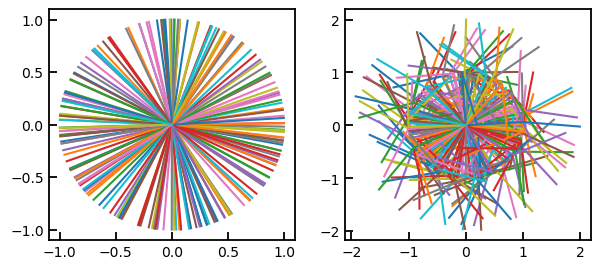

In [318]:
fig, ax = plt.subplots(1, 2, figsize=(7, 3))
for axs in [0, 1]:
    plt.setp(ax[axs].spines.values(), linewidth=1.3)
    ax[axs].tick_params(which="minor", direction="in", length=3, width=1.3,)
    ax[axs].tick_params(which="major", direction="in", length=6, width=1.3)
    

ax[0].plot([P[:,0], P2[:,0]], [P[:,1], P2[:,1]]);

ax[1].plot([P[:,0], P2[:,0], P3[:,0]], [P[:,1], P2[:,1], P3[:,1]]);

In [372]:
#Walk 200 Walkers 70 times
w2 = Walker(200)
for n in range(70):
    w2.walk()

#Walk 200 Walkers 1000 times and save the root-mean-square after each walk.
w3 = Walker(200)
rmss = np.array([w3.rms])
for t in range(1000):
    w3.walk()
    rmss = np.append(rmss, w3.rms)


/var/folders/hx/0yg2wcqs2gj6t85dcg16np8m0000gn/T/ipykernel_84301/2689550563.py:11: RuntimeWarning: divide by zero encountered in log
  ax[1].plot(np.log(range(1001)), np.log(rmss));


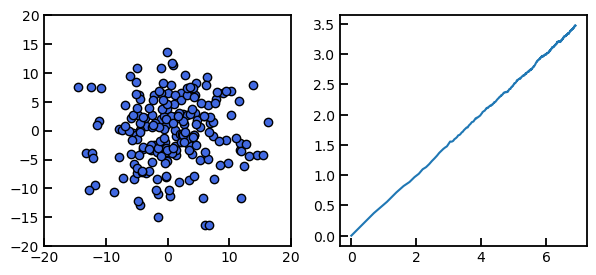

In [374]:
#Plot the results
fig, ax = plt.subplots(1, 2, figsize=(7, 3))
for axs in [0, 1]:
    plt.setp(ax[axs].spines.values(), linewidth=1.3)
    ax[axs].tick_params(which="minor", direction="in", length=3, width=1.3,)
    ax[axs].tick_params(which="major", direction="in", length=6, width=1.3)
ax[0].set_xlim(-20, 20)
ax[0].set_ylim(-20, 20)
#for n in range(w2.N):
ax[0].scatter(w2.P[:,0], w2.P[:,1], color="royalblue", edgecolor='k')
ax[1].plot(np.log(range(1001)), np.log(rmss));

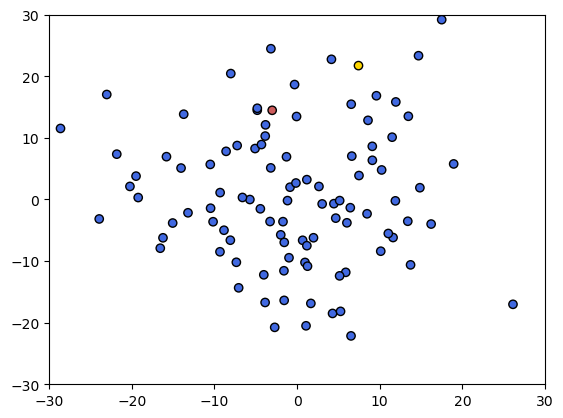

In [408]:
from matplotlib import animation
N = 200
fig, ax = plt.subplots()
ax.set_ylim(-30, 30)
ax.set_xlim(-30, 30)
plt.rc('animation', html='jshtml')

W = Walker(100)

colors = []
for i in range(W.N):
    colors.append("royalblue")
colors[10] = "indianred"
colors[30] = "gold"

P_current = W.P
walker = ax.scatter(P_current[:,0], P_current[:,1], color=colors, edgecolor='k', alpha=1)
def update(i):
    W.walk()
    walker.set_offsets(W.P)
    return [walker]

anim = animation.FuncAnimation(fig, update, frames=N, interval=30, blit=True)
anim